Data Processing Part:


In [ ]:
import numpy as np
import time
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torch.utils.data.sampler import SubsetRandomSampler
from torchvision import datasets, transforms

In [ ]:
import os
import shutil

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Creating classes from a raw dataset
#os.makedirs(level0_folder)
'''
os.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/train/level0')
os.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/train/level1')
os.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/train/level2')
os.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/train/level3')
os.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/valid/level0')
os.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/valid/level1')
os.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/valid/level2')
os.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/valid/level3')
os.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/test/level0')
os.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/test/level1')
os.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/test/level2')
os.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/test/level3')
'''

"\nos.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/train/level0')\nos.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/train/level1')\nos.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/train/level2')\nos.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/train/level3')\nos.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/valid/level0')\nos.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/valid/level1')\nos.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/valid/level2')\nos.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/valid/level3')\nos.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/test/level0')\nos.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/test/level1')\nos.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/test/level2')\nos.makedirs('/content/drive/MyDrive/acne04.v1i.multiclass/test/level3')\n"

In [ ]:
#current_files = os.listdir('/content/drive/MyDrive/acne04.v1i.multiclass/train')

#for name in current_files:
 # if name.startswith('levle0'):
  #  shutil.move(os.path.join('/content/drive/MyDrive/acne04.v1i.multiclass/train', name), '/content/drive/MyDrive/acne04.v1i.multiclass/train/level0')
  #if name.startswith('levle1'):
   # shutil.move(os.path.join('/content/drive/MyDrive/acne04.v1i.multiclass/train', name), '/content/drive/MyDrive/acne04.v1i.multiclass/train/level1')
  #if name.startswith('levle2'):
   # shutil.move(os.path.join('/content/drive/MyDrive/acne04.v1i.multiclass/train', name), '/content/drive/MyDrive/acne04.v1i.multiclass/train/level2')
  #if name.startswith('levle3'):
   # shutil.move(os.path.join('/content/drive/MyDrive/acne04.v1i.multiclass/train', name), '/content/drive/MyDrive/acne04.v1i.multiclass/train/level3')

In [ ]:
#current_files = os.listdir('/content/drive/MyDrive/acne04.v1i.multiclass/valid')

#for name in current_files:
 # if name.startswith('levle0'):
  #  shutil.move(os.path.join('/content/drive/MyDrive/acne04.v1i.multiclass/valid', name), '/content/drive/MyDrive/acne04.v1i.multiclass/valid/level0')
  #if name.startswith('levle1'):
   # shutil.move(os.path.join('/content/drive/MyDrive/acne04.v1i.multiclass/valid', name), '/content/drive/MyDrive/acne04.v1i.multiclass/valid/level1')
  #if name.startswith('levle2'):
   # shutil.move(os.path.join('/content/drive/MyDrive/acne04.v1i.multiclass/valid', name), '/content/drive/MyDrive/acne04.v1i.multiclass/valid/level2')
  #if name.startswith('levle3'):
   # shutil.move(os.path.join('/content/drive/MyDrive/acne04.v1i.multiclass/valid', name), '/content/drive/MyDrive/acne04.v1i.multiclass/valid/level3')

In [ ]:
#current_files = os.listdir('/content/drive/MyDrive/acne04.v1i.multiclass/test')

#for name in current_files:
  #if name.startswith('levle0'):
  #  shutil.move(os.path.join('/content/drive/MyDrive/acne04.v1i.multiclass/test', name), '/content/drive/MyDrive/acne04.v1i.multiclass/test/level0')
 # if name.startswith('levle1'):
   # shutil.move(os.path.join('/content/drive/MyDrive/acne04.v1i.multiclass/test', name), '/content/drive/MyDrive/acne04.v1i.multiclass/test/level1')
 # if name.startswith('levle2'):
   # shutil.move(os.path.join('/content/drive/MyDrive/acne04.v1i.multiclass/test', name), '/content/drive/MyDrive/acne04.v1i.multiclass/test/level2')
 # if name.startswith('levle3'):
   # shutil.move(os.path.join('/content/drive/MyDrive/acne04.v1i.multiclass/test', name), '/content/drive/MyDrive/acne04.v1i.multiclass/test/level3')

In [ ]:
# NOTE: To run using the folder Anuar shared, go to the shared folder in Google Drive and click "Add shortcut to Drive"
# https://stackoverflow.com/questions/54351852/accessing-shared-with-me-with-colab -- worked for me (Matthew)

transform_app = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))]);

acne_train = datasets.ImageFolder('/content/drive/MyDrive/acne04.v1i.multiclass/train', transform_app)
acne_validation = datasets.ImageFolder('/content/drive/MyDrive/acne04.v1i.multiclass/valid', transform_app)
acne_test = datasets.ImageFolder('/content/drive/MyDrive/acne04.v1i.multiclass/test', transform_app)

In [ ]:
print(len(acne_train))

702


In [ ]:
print(acne_train.classes)

['level0', 'level1', 'level2', 'level3']


In [ ]:
!pip install deepface

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.8/87.8 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.3/88.3 kB 12.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.2/80.2 kB 12.9 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.5.0-py2.py3-none-any.whl size=116934 sha256=296b703e32a7bcc46c90e736dd202db2c7d4370ec1e1fb59277d58035a95f2be
  Stored in directory: /root/.cache/pip/wheels/90/d4/f7/9404e5db0116bd4d43e5666eaa3e70ab53723e1e3ea40c9a95
Successfully built fire


In [ ]:
from deepface import DeepFace

24-03-10 19:12:46 - Directory /root/.deepface created
24-03-10 19:12:46 - Directory /root/.deepface/weights created


24-03-10 19:12:53 - ⚠️ Function detectFace is deprecated. Use extract_faces instead.


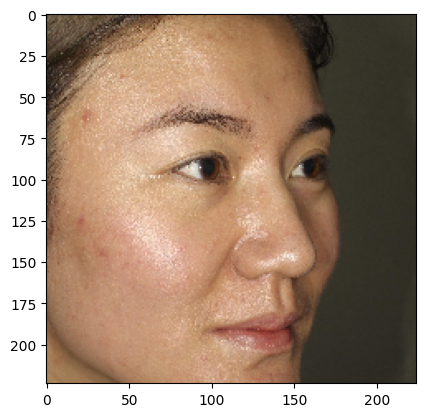

In [ ]:
#levle0_4_jpg.rf.ca332582f65e8a4455d3db1566f95e86
import matplotlib.pyplot as plt
face_objs = DeepFace.detectFace(img_path="/content/drive/MyDrive/acne04.v1i.multiclass/train/level0/levle0_21_jpg.rf.75abac6db7b986418fc29aeb78ba59a2.jpg", target_size = (224,224))
plt.imshow(face_objs)
plt.show()

In [ ]:
current_files = os.listdir('/content/drive/MyDrive/acne04.v1i.multiclass/train/level0')
counter = 0
for name in current_files:
    try:
      DeepFace.detectFace(os.path.join('/content/drive/MyDrive/acne04.v1i.multiclass/train/level0', name))
    except ValueError:
      os.remove(os.path.join('/content/drive/MyDrive/acne04.v1i.multiclass/train/level0', name))
    else:
      counter += 1

    #os.remove(os.path.join('/content/drive/MyDrive/acne04.v1i.multiclass/train/level0', name))
    #shutil.move(os.path.join('/content/drive/MyDrive/acne04.v1i.multiclass/train', name), '/content/drive/MyDrive/acne04.v1i.multiclass/train/level0')

24-03-10 19:13:14 - ⚠️ Function detectFace is deprecated. Use extract_faces instead.
24-03-10 19:13:21 - ⚠️ Function detectFace is deprecated. Use extract_faces instead.
24-03-10 19:13:31 - ⚠️ Function detectFace is deprecated. Use extract_faces instead.
24-03-10 19:13:37 - ⚠️ Function detectFace is deprecated. Use extract_faces instead.
24-03-10 19:13:44 - ⚠️ Function detectFace is deprecated. Use extract_faces instead.
24-03-10 19:13:50 - ⚠️ Function detectFace is deprecated. Use extract_faces instead.
24-03-10 19:13:54 - ⚠️ Function detectFace is deprecated. Use extract_faces instead.
24-03-10 19:14:03 - ⚠️ Function detectFace is deprecated. Use extract_faces instead.
24-03-10 19:14:06 - ⚠️ Function detectFace is deprecated. Use extract_faces instead.


PermissionError: [Errno 1] Operation not permitted: '/content/drive/MyDrive/acne04.v1i.multiclass/train/level0/levle0_457_jpg.rf.fe12ecf15a40f2094356dee61f1a1993.jpg'

In [ ]:
import cv2

In [ ]:
current_files = os.listdir('/content/drive/MyDrive/acne04.v1i.multiclass/train/level0')
os.chdir('/content/drive/MyDrive/acne04.v1i.multiclass/train/level0')

for name in current_files:
    try:
      detected_face_ = DeepFace.detectFace(os.path.join('/content/drive/MyDrive/acne04.v1i.multiclass/train/level0', name), target_size = (224,224))
    except ValueError:
      os.remove(os.path.join('/content/drive/MyDrive/acne04.v1i.multiclass/train/level0', name))
    else:
      os.remove(os.path.join('/content/drive/MyDrive/acne04.v1i.multiclass/train/level0', name))
      detected_face_ = detected_face_*255
      cv2.imwrite(name, detected_face_[:,:,::-1])
    detected_face_ = 0


24-03-10 19:14:18 - ⚠️ Function detectFace is deprecated. Use extract_faces instead.


PermissionError: [Errno 1] Operation not permitted: '/content/drive/MyDrive/acne04.v1i.multiclass/train/level0/levle0_463_jpg.rf.cf25eca47925a60407a6f17a15ca0fcb.jpg'

In [ ]:
#transform_app = transforms.Compose([transforms.ToTensor(), ransforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)), transforms.Resize(224, 224)]);
target_size = (224, 224)

transform_app = transforms.Compose([transforms.Resize(target_size),transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]);
acne_train = datasets.ImageFolder('/content/drive/MyDrive/acne04.v1i.multiclass/train', transform_app)
acne_validation = datasets.ImageFolder('/content/drive/MyDrive/acne04.v1i.multiclass/valid', transform_app)
acne_test = datasets.ImageFolder('/content/drive/MyDrive/acne04.v1i.multiclass/test', transform_app)

In [ ]:
print(len(acne_train))

702


In [ ]:
print(len(acne_validation))

143


In [ ]:
print(len(acne_test))

102


In [ ]:
class AcneSeverity(nn.Module):
    def __init__(self):
        super(AcneSeverity, self).__init__()
        self.name = "4_classes"
        self.conv1 = nn.Conv2d(3, 20, 5, 1, 0) #After first layer -> 224x224 -> 224 - 5 + 1 = 220
        self.pool1 = nn.MaxPool2d(2, 2) #After fist pooling -> 110
        self.conv2 = nn.Conv2d(20, 40, 5, 1, 0) #After second layer -> 110x110 -> 110 - 5 + 1 = 106
        self.pool2 = nn.MaxPool2d(2, 2) #After fist pooling -> 110
        self.conv3 = nn.Conv2d(40, 10, 5, 1, 0) #After second layer -> 110x110 -> 110 - 5 + 1 = 106
        self.fc1 = nn.Linear(10*49*49, 32) #106/2 = 53
        self.fc2 = nn.Linear(32, 4)

    def forward(self, x):
        x = self.pool1(F.relu(self.conv1(x)))
        x = self.pool2(F.relu(self.conv2(x)))
        x = F.relu(self.conv3(x))
        x = x.view(-1, 10*49*49)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

In [ ]:
import matplotlib.pyplot as plt
def train(model, data, batch_size=50, num_epochs=10):
    train_loader = torch.utils.data.DataLoader(data, batch_size=batch_size)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(net.parameters(), lr=learning_rate, momentum=0.9)

    train_err = np.zeros(num_epochs)
    train_loss = np.zeros(num_epochs)
    val_err = np.zeros(num_epochs)
    val_loss = np.zeros(num_epochs)
    start_time = time.time()
    n = 0
    for epoch in range(num_epochs):
        for imgs, labels in iter(train_loader):

            out = model(imgs)

            loss = criterion(out, labels)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

            iters.append(n)
            losses.append(float(loss)/batch_size)
            train_acc.append(get_accuracy_train(model))
            val_acc.append(get_accuracy_validation(model))
            n += 1
        print("Epoch Number Done:", epoch)
    # plotting
    plt.title("Evaluating Training Loss")
    plt.plot(iters, losses, label="Train")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.show()

    plt.title("Evaluating Accuracy")
    plt.plot(iters, train_acc, label="Train")
    plt.plot(iters, val_acc, label="Validation")
    plt.xlabel("Iterations")
    plt.ylabel("Training Accuracy")
    plt.legend(loc='best')
    plt.show()

    print("Final Training Accuracy: {}".format(train_acc[-1]))
    print("Final Validation Accuracy: {}".format(val_acc[-1]))

In [ ]:
def get_accuracy_train(model):

    data = acne_train_partial

    correct = 0
    total = 0
    for imgs, labels in torch.utils.data.DataLoader(data, batch_size=50):

        output = model(imgs)

        pred = output.max(1, keepdim=True)[1]
        correct += pred.eq(labels.view_as(pred)).sum().item()
        total += imgs.shape[0]
    return correct / total

In [ ]:
def get_accuracy_validation(model):

    data = acne_validation

    correct = 0
    total = 0
    for imgs, labels in torch.utils.data.DataLoader(data, batch_size=50):

        output = model(imgs)

        pred = output.max(1, keepdim=True)[1]
        correct += pred.eq(labels.view_as(pred)).sum().item()
        total += imgs.shape[0]
    return correct / total

In [ ]:
testing_model = AcneSeverity()

train(testing_model, acne_train_partial)


KeyboardInterrupt: 

In [ ]:
DataBase = {}
from PIL import Image

In [ ]:
transform_app = transforms.Compose([transforms.ToTensor()]);

In [ ]:

path_to_folder = '/content/drive/MyDrive/acne04.v1i.multiclass/test/level0'
transform_app = transforms.Compose([transforms.ToTensor()]);
average_red_pixels = 0
total_red = 0
total_pixels = 0
for imgs in os.listdir(path_to_folder):
  path_to_image = os.path.join(path_to_folder, imgs)
  current_image = Image.open(path_to_image)
  current_image = transform_app(current_image)
  # extracts just the red pixels from the image
  red = current_image[0, :, :]
  total_red += torch.sum(red).item()
  total_pixels += red.numel()

average_red_pixels = total_red/total_pixels

DataBase['level0'] = average_red_pixels



In [ ]:
print(DataBase['level0'])

0.44883570475954515


In [ ]:

path_to_folder = '/content/drive/MyDrive/acne04.v1i.multiclass/test/level1'
transform_app = transforms.Compose([transforms.ToTensor()]);
average_red_pixels = 0
total_red = 0
total_pixels = 0
for imgs in os.listdir(path_to_folder):
  path_to_image = os.path.join(path_to_folder, imgs)
  current_image = Image.open(path_to_image)
  current_image = transform_app(current_image)
  red = current_image[0, :, :]
  total_red += torch.sum(red).item()
  total_pixels += red.numel()

average_red_pixels = total_red/total_pixels

DataBase['level1'] = average_red_pixels


In [ ]:
print(DataBase['level1'])

0.4478896289829223


In [ ]:
path_to_folder = '/content/drive/MyDrive/acne04.v1i.multiclass/test/level2'
transform_app = transforms.Compose([transforms.ToTensor()]);
average_red_pixels = 0
total_red = 0
total_pixels = 0
for imgs in os.listdir(path_to_folder):
  path_to_image = os.path.join(path_to_folder, imgs)
  current_image = Image.open(path_to_image)
  current_image = transform_app(current_image)
  red = current_image[0, :, :]
  total_red += torch.sum(red).item()
  total_pixels += red.numel()

average_red_pixels = total_red/total_pixels

DataBase['level2'] = average_red_pixels

In [ ]:
print(DataBase['level2'])

0.45246604259301654


In [ ]:
path_to_folder = '/content/drive/MyDrive/acne04.v1i.multiclass/test/level3'
transform_app = transforms.Compose([transforms.ToTensor()]);
average_red_pixels = 0
total_red = 0
total_pixels = 0

for imgs in os.listdir(path_to_folder):
  path_to_image = os.path.join(path_to_folder, imgs)
  current_image = Image.open(path_to_image)
  current_image = transform_app(current_image)
  red = current_image[0, :, :]
  total_red += torch.sum(red).item()
  total_pixels += red.numel()

average_red_pixels = total_red/total_pixels

DataBase['level3'] = average_red_pixels


In [ ]:
print(DataBase['level3'])

0.44908210585635605


In [ ]:
# reference: https://en.wikipedia.org/wiki/HSL_and_HSV
# Note: only returns hue, and luminosity, and not saturation from HSL
def getHLFromRGB(R,G,B):
  M = max(R,G,B)
  m = min(R,G,B)
  C = M - m

  hPrime = 0
  if (C == 0):
    pass
  elif (M == R):
    hPrime = ((G-B)/C)%6
  elif (M == G):
    hPrime = ((B-R)/C) + 2
  elif (M == B):
    hPrime = ((R-G)/C) + 4
  return (int(60 * hPrime), (0.5*(M+m)/255))

h,l = getHLFromRGB(218, 251, 249)
print(h)
print(l)

176
0.9196078431372549


In [ ]:
# Baseline Model Version 2: Clusters of Red

def clusterRed(path_to_folder):
  stride = 5
  # set kernel height/width to 3% of lowest dimension
  kernel_size = 7

  total_red = 0
  flag = False

  transform_crop = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)), transforms.CenterCrop(224)]);

  for imgs in os.listdir(path_to_folder):
    path_to_image = os.path.join(path_to_folder, imgs)
    current_image = Image.open(path_to_image)
    current_image = transform_crop(current_image)
    red = current_image[0, :, :]
    green = current_image[1,:,:]
    blue = current_image[2,:,:]

    _,height, width = current_image.shape

    total_red = 0

    for row in range(height-kernel_size):
      for col in range(width-kernel_size):
          # convert each pixel RGB to HSL (only care about H (hue))

          # kernel loop
          for k_h in range(kernel_size):
            for k_w in range(kernel_size):
              r = red[row+k_h][col+k_w].item()*255
              g = green[row+k_h][col+k_w].item()*255
              b = blue[row+k_h][col+k_w].item()*255

              hue, luminosity = getHLFromRGB(r,g,b)
              # search for red hue (arbitrary limit range)
              if ((hue >15 and hue < 325) or luminosity > 0.95):
                flag = True
                break
            if flag == True:
              break
          if flag == True:
            flag = False
          else:
            # found a group of red pixels
            total_red+=1
            col += stride
    print(total_red)
    if (total_red < 5000):
        print("Class 0")
    elif(total_red > 15000):
        print("Class 3")
    elif(total_red > 5000 and total_red < 8000):
      print("Class 1")
    else:
      print("Class 2")

##Attempt to draw boxes with Baseline Model:

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from google.colab.patches import cv2_imshow

In [ ]:
def clusterRedWithBoxes(path_to_folder):
  stride = 5
  # set kernel height/width to 3% of lowest dimension
  kernel_size = 7
  total_red = 0


  transform_crop = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)), transforms.CenterCrop(224)])
  crop_only = transforms.CenterCrop(224)

  for imgs in os.listdir(path_to_folder):
    path_to_image = os.path.join(path_to_folder, imgs)
    current_image_open = Image.open(path_to_image)

    current_image = transform_crop(current_image_open)
    red = current_image[0, :, :]
    green = current_image[1,:,:]
    blue = current_image[2,:,:]

    _,height, width = current_image.shape

    total_red = 0
    #list_of_boxes is a list of lists that has 3 elements:
    # xy position tuple (float, float), width, height
    list_of_boxes = []
    currXY = (0,0)
    rect_height = 0
    rect_width = 0
    flag = False
    firstFind = True

    for row in range(height-kernel_size):
      for col in range(width-kernel_size):
          # convert each pixel RGB to HSL (only care about H (hue))

          # kernel loop
          for k_h in range(kernel_size):
            for k_w in range(kernel_size):
              r = red[row+k_h][col+k_w].item()*255
              g = green[row+k_h][col+k_w].item()*255
              b = blue[row+k_h][col+k_w].item()*255

              hue, luminosity = getHLFromRGB(r,g,b)
              # search for red hue (arbitrary limit range)
              if ((hue >15 and hue < 325) or luminosity > 0.95):
                # not red if got here
                flag = True

                if (rect_height >0 or rect_width >0):
                  list_of_boxes.append([currXY,rect_width,rect_height])
                  # reset values
                  firstFind = True
                  rect_height = 0
                  rect_width = 0
                  currXY = (0,0)

                break
            if flag == True:
              break
          if flag == True:
            flag = False
          else:
            # found a group of red pixels

            if firstFind == True:
              currXY = (row,col)
              rect_height = kernel_size
              rect_width = kernel_size
            else:
              if(currXY[0] != row):
                rect_height = kernel_size + abs(currXY[0] - row)*stride
              if(currXY[1] != col):
                rect_width = kernel_size + abs(currXY[1] - col)*stride

            total_red+=1
            col += stride

    print(total_red)
    if (total_red < 5000):
        print("Class 0")
    elif(total_red > 15000):
        print("Class 3")
    elif(total_red > 5000 and total_red < 8000):
      print("Class 1")
    else:
      print("Class 2")

    # plot the box with the rectangle
    current_image_open = crop_only(current_image_open)
    fig, (ax1,ax2) = plt.subplots(1,2)

    # Display the image
    ax1.imshow(current_image_open)
    ax2.imshow(current_image_open)

    print("number of boxes: ",len(list_of_boxes))
    # Create Rectangle patches
    for box in list_of_boxes:
      rect = patches.Rectangle(box[0], box[1], box[2], linewidth=0.5, edgecolor='r', facecolor='none')
      # Add the patch to the Axes
      ax2.add_patch(rect)

    plt.show()

    del list_of_boxes[:]



31296
Class 3
number of boxes:  616


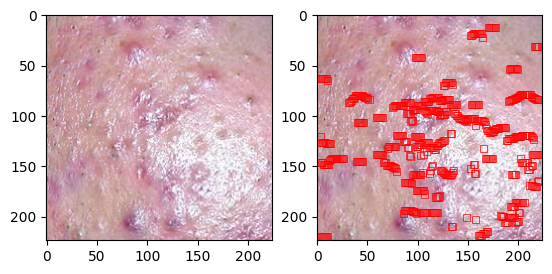

3603
Class 0
number of boxes:  403


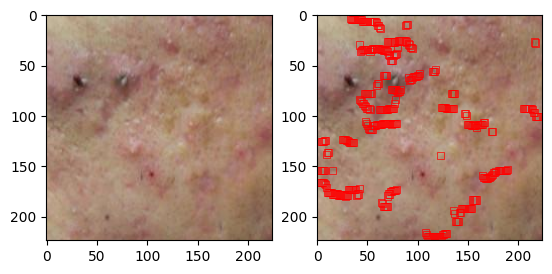

34305
Class 3
number of boxes:  464


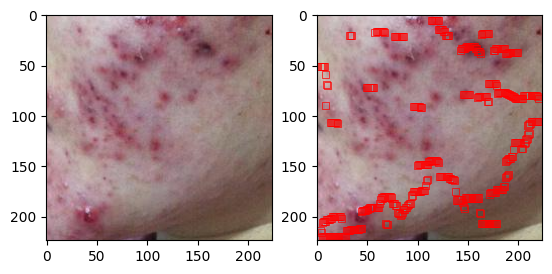

26859
Class 3
number of boxes:  373


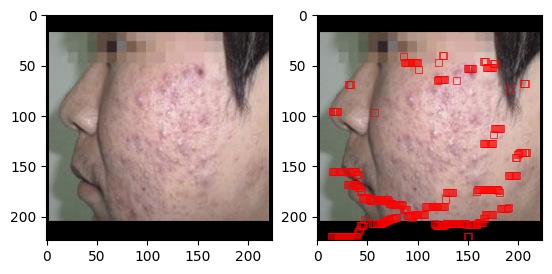

0
Class 0
number of boxes:  0


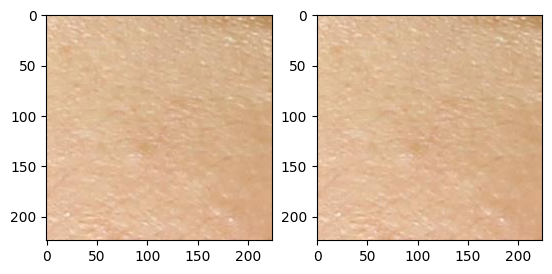

45270
Class 3
number of boxes:  136


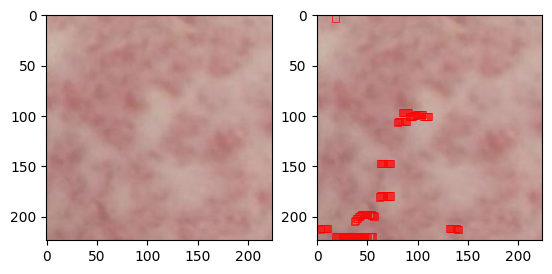

3135
Class 0
number of boxes:  248


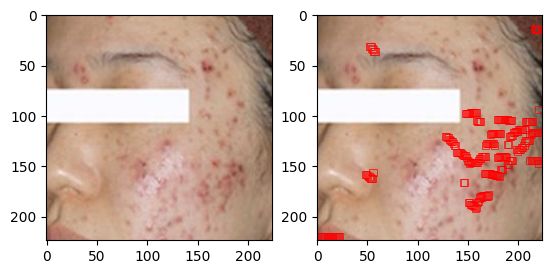

12562
Class 2
number of boxes:  841


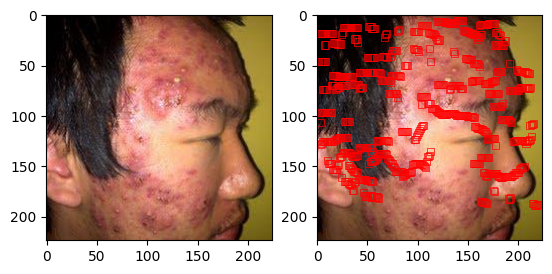

28092
Class 3
number of boxes:  959


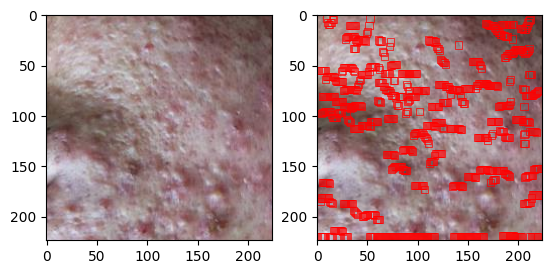

46850
Class 3
number of boxes:  30


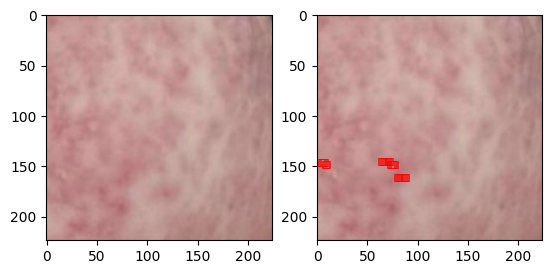

21192
Class 3
number of boxes:  859


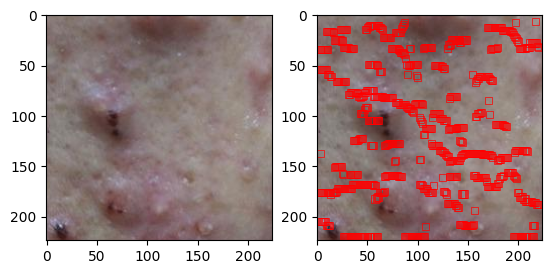

31604
Class 3
number of boxes:  292


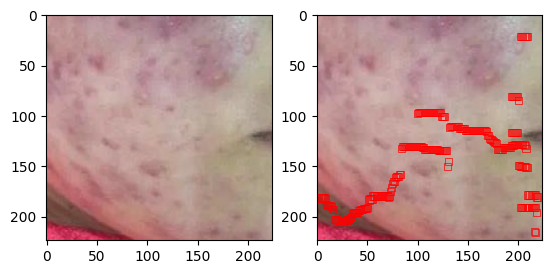

45198
Class 3
number of boxes:  110


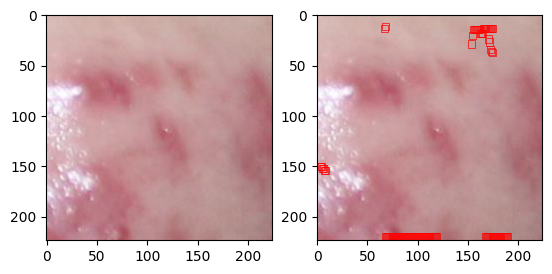

23055
Class 3
number of boxes:  657


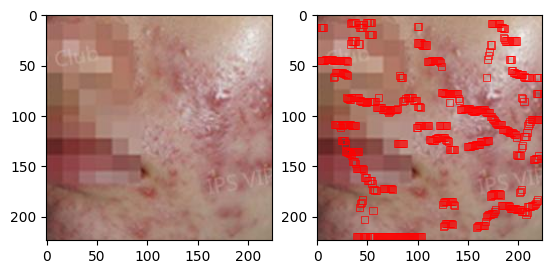

33987
Class 3
number of boxes:  455


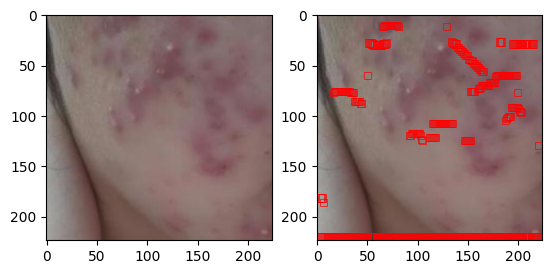

34660
Class 3
number of boxes:  647


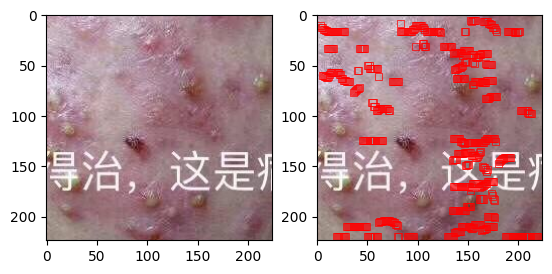

2631
Class 0
number of boxes:  147


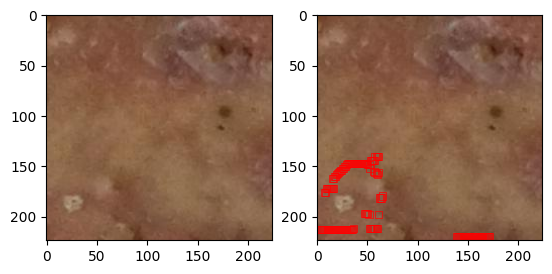

31974
Class 3
number of boxes:  630


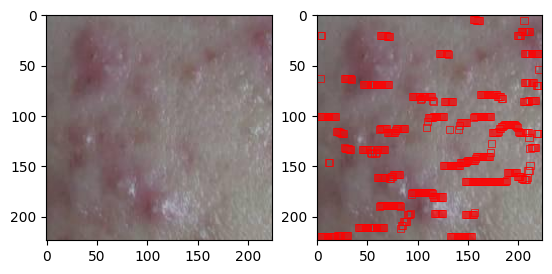

0
Class 0
number of boxes:  0


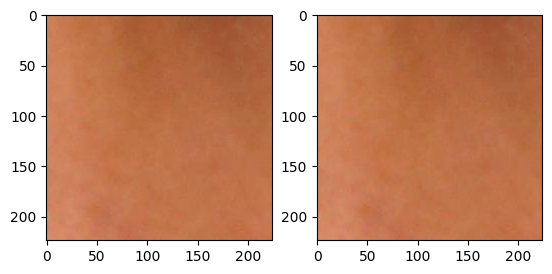

2167
Class 0
number of boxes:  198


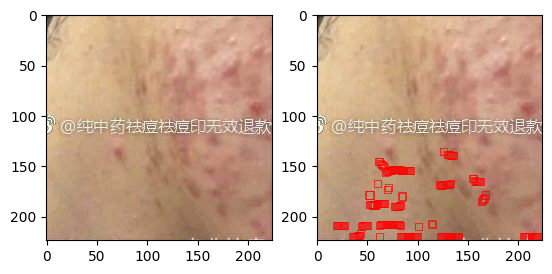

42805
Class 3
number of boxes:  278


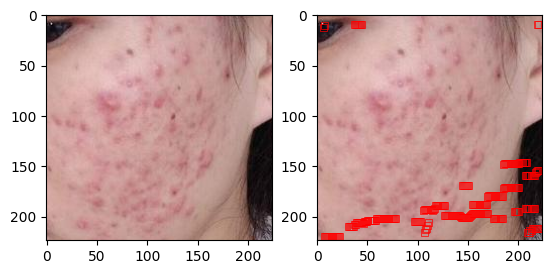

30269
Class 3
number of boxes:  634


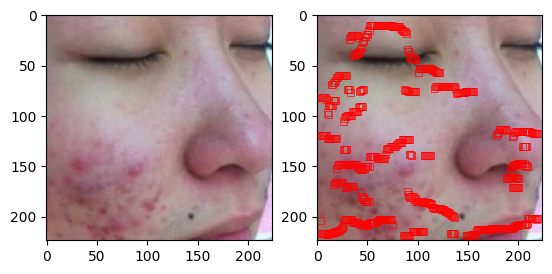

21130
Class 3
number of boxes:  506


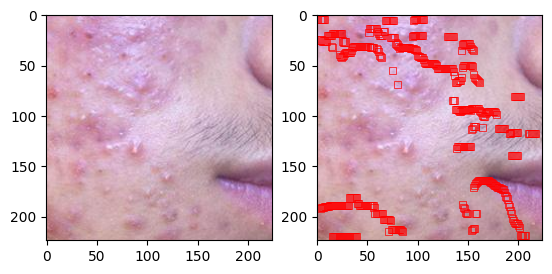

27920
Class 3
number of boxes:  660


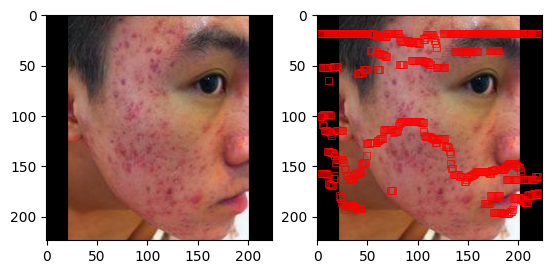

24324
Class 3
number of boxes:  700


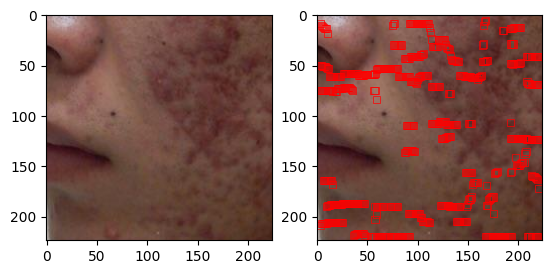

13279
Class 2
number of boxes:  469


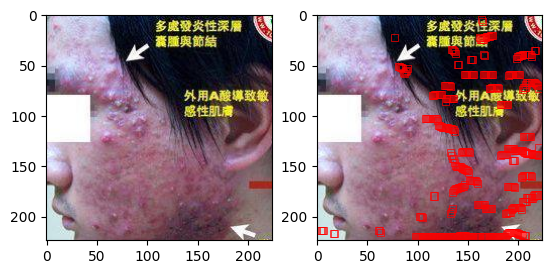

8087
Class 2
number of boxes:  342


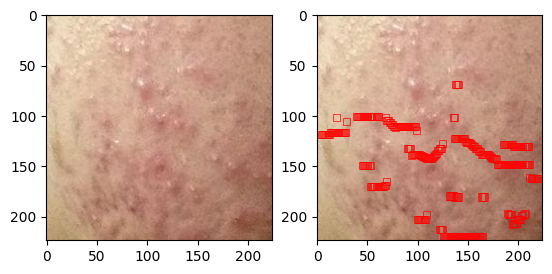

23475
Class 3
number of boxes:  798


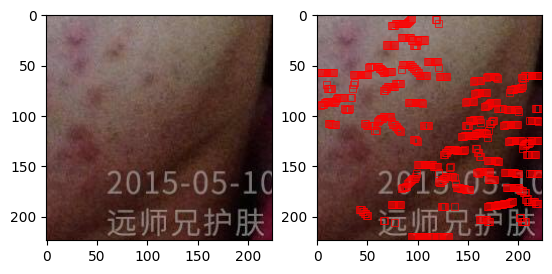

0
Class 0
number of boxes:  0


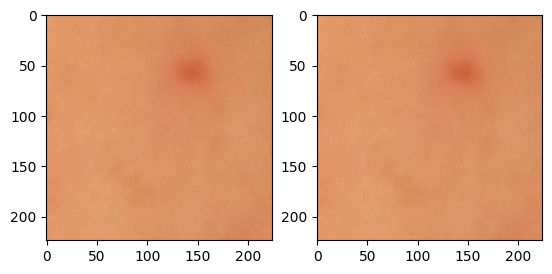

0
Class 0
number of boxes:  0


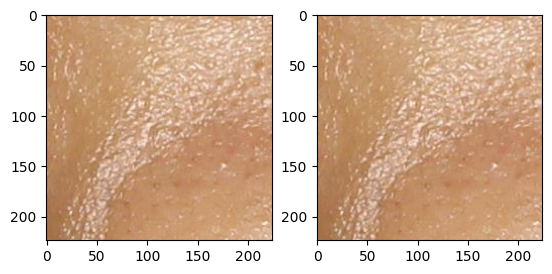

20144
Class 3
number of boxes:  578


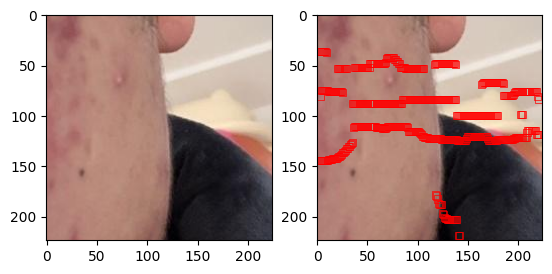

39628
Class 3
number of boxes:  413


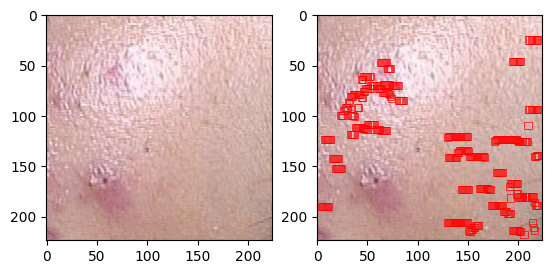

37151
Class 3
number of boxes:  133


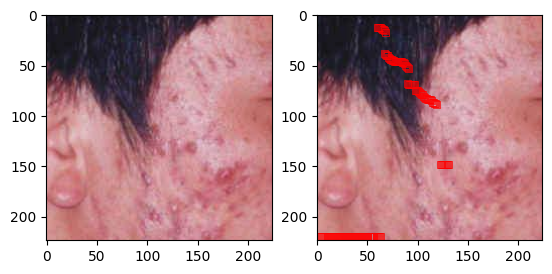

16828
Class 3
number of boxes:  888


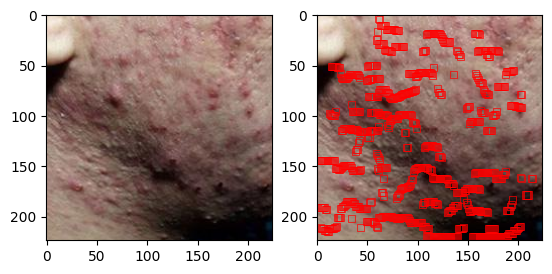

16058
Class 3
number of boxes:  664


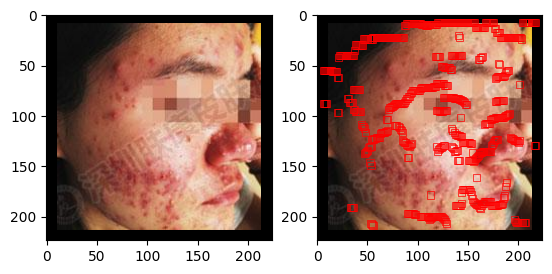

0
Class 0
number of boxes:  0


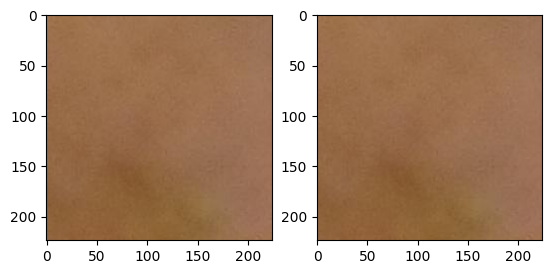

19047
Class 3
number of boxes:  434


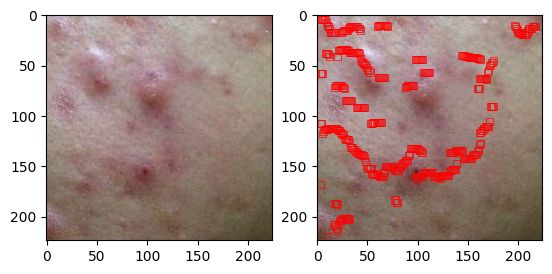

43068
Class 3
number of boxes:  141


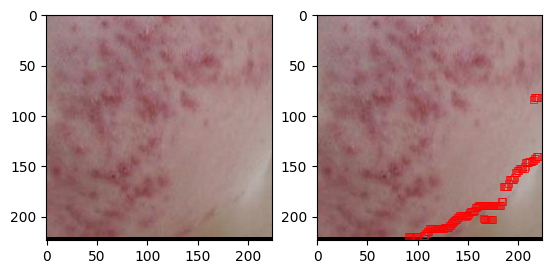

266
Class 0
number of boxes:  38


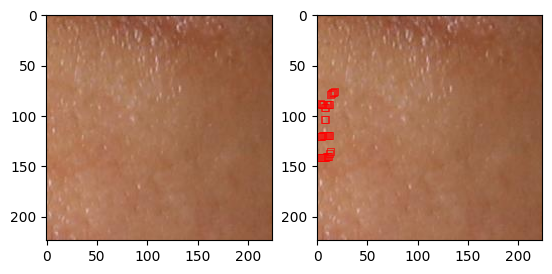

32821
Class 3
number of boxes:  608


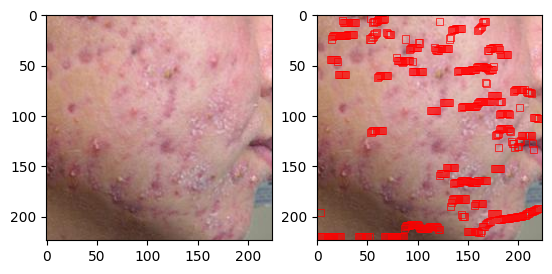

358
Class 0
number of boxes:  65


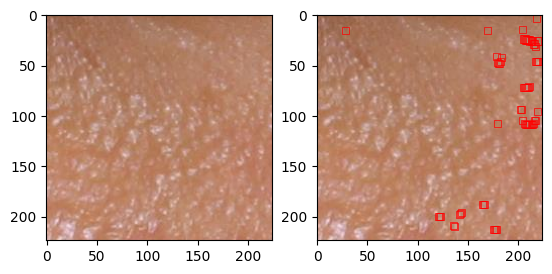

38760
Class 3
number of boxes:  517


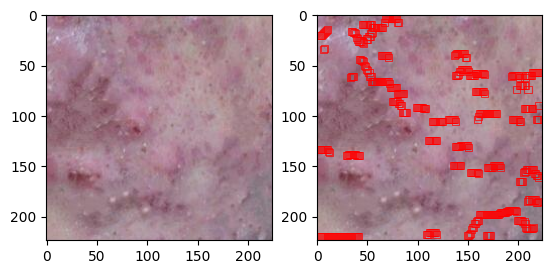

3943
Class 0
number of boxes:  169


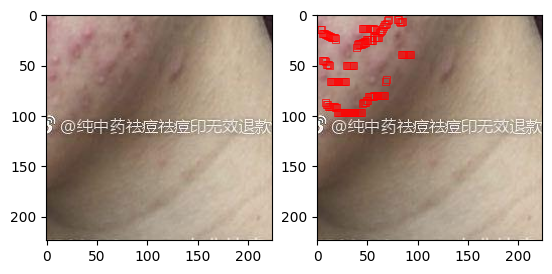

38977
Class 3
number of boxes:  365


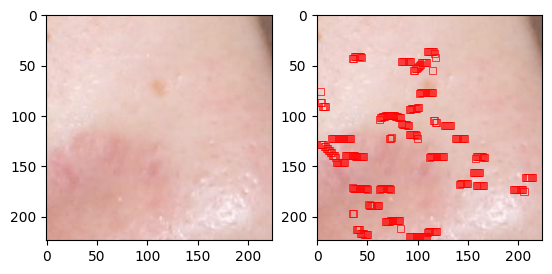

18149
Class 3
number of boxes:  352


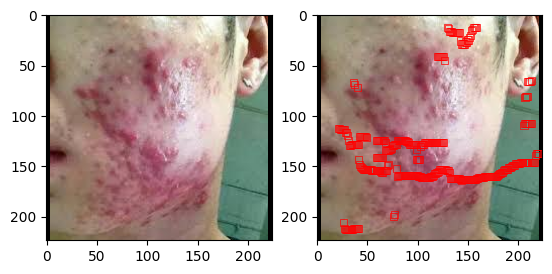

33940
Class 3
number of boxes:  416


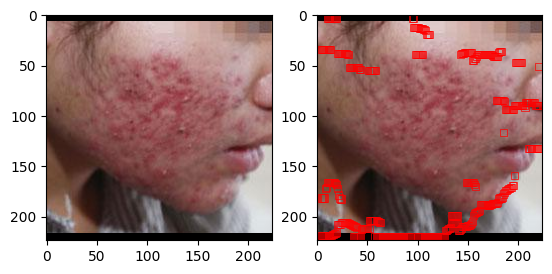

39688
Class 3
number of boxes:  440


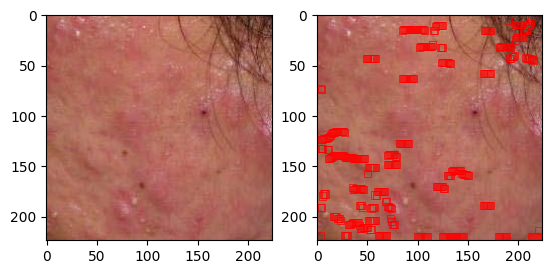

44996
Class 3
number of boxes:  148


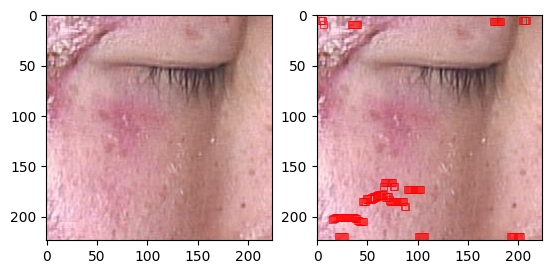

10763
Class 2
number of boxes:  437


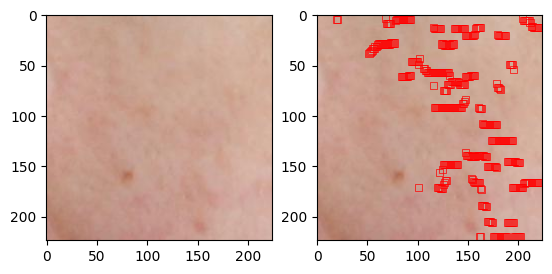

4798
Class 0
number of boxes:  331


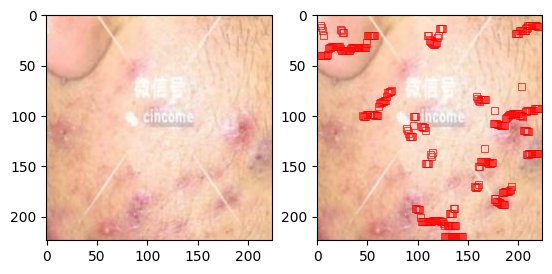

36644
Class 3
number of boxes:  468


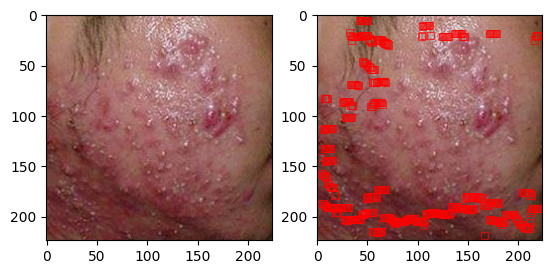

46137
Class 3
number of boxes:  59


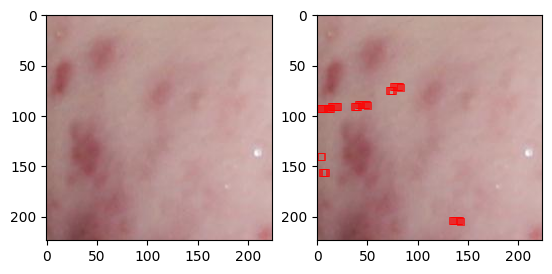

46786
Class 3
number of boxes:  30


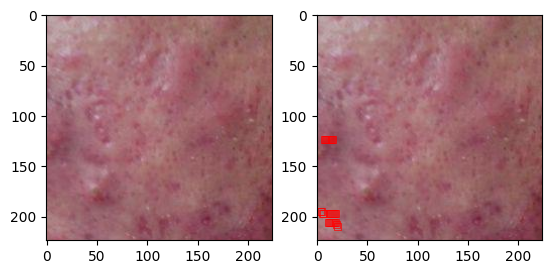

KeyboardInterrupt: 

In [ ]:
clusterRedWithBoxes('/content/drive/MyDrive/acne04.v1i.multiclass/train/level3')

0
Class 0
number of boxes:  0


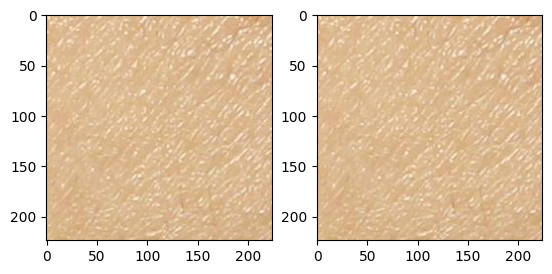

43
Class 0
number of boxes:  5


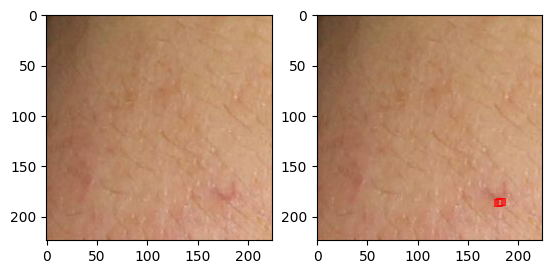

0
Class 0
number of boxes:  0


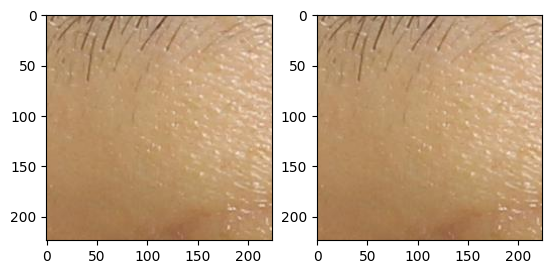

98
Class 0
number of boxes:  10


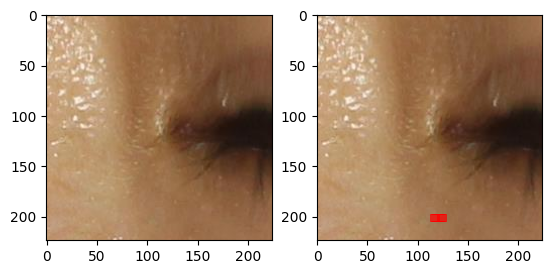

0
Class 0
number of boxes:  0


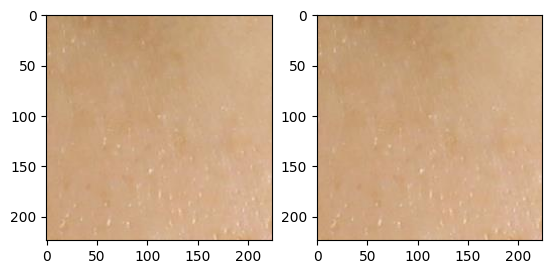

0
Class 0
number of boxes:  0


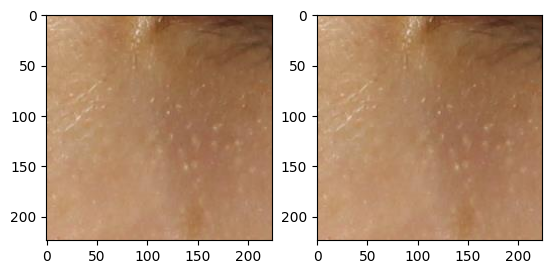

86
Class 0
number of boxes:  18


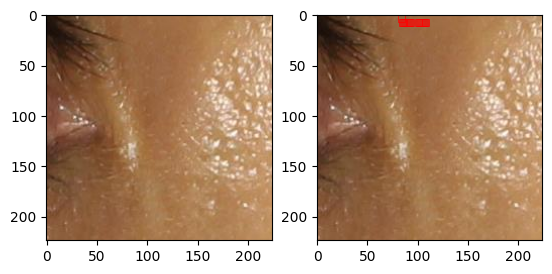

0
Class 0
number of boxes:  0


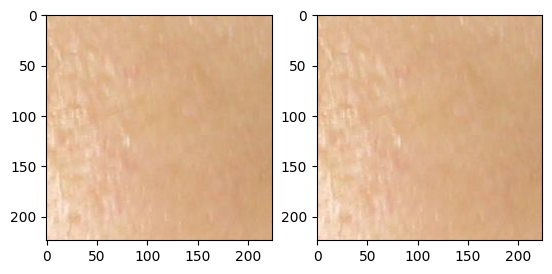

0
Class 0
number of boxes:  0


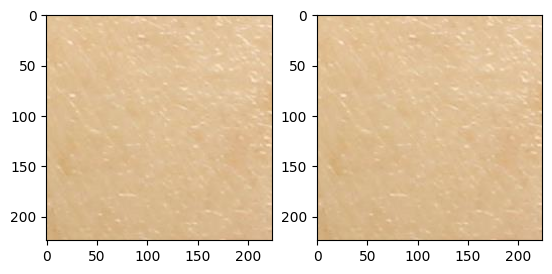

0
Class 0
number of boxes:  0


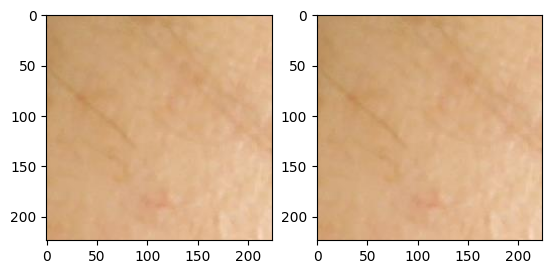

42588
Class 3
number of boxes:  287


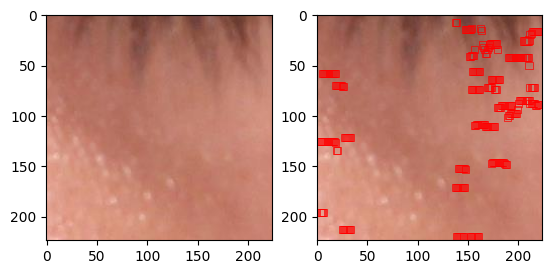

0
Class 0
number of boxes:  0


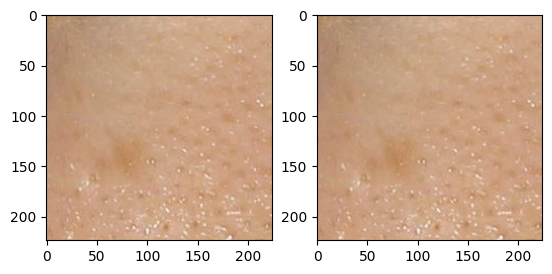

723
Class 0
number of boxes:  88


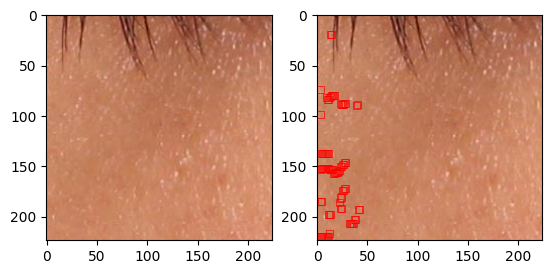

1650
Class 0
number of boxes:  165


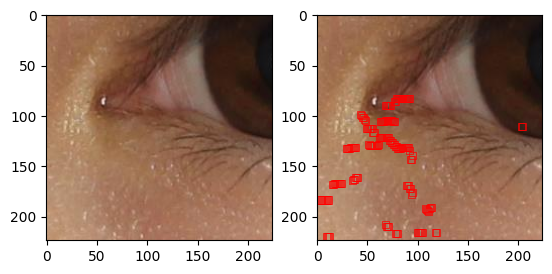

0
Class 0
number of boxes:  0


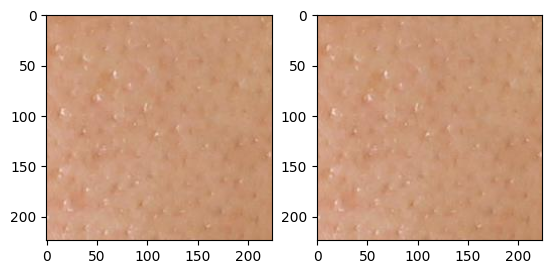

0
Class 0
number of boxes:  0


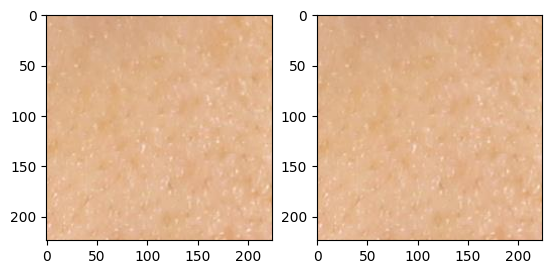

1746
Class 0
number of boxes:  156


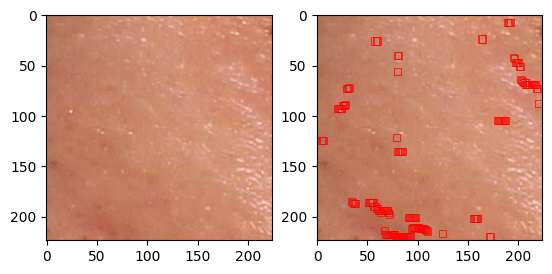

0
Class 0
number of boxes:  0


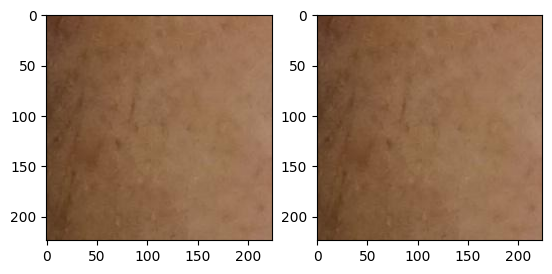

902
Class 0
number of boxes:  114


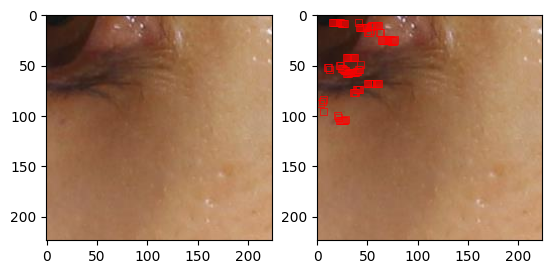

3
Class 0
number of boxes:  3


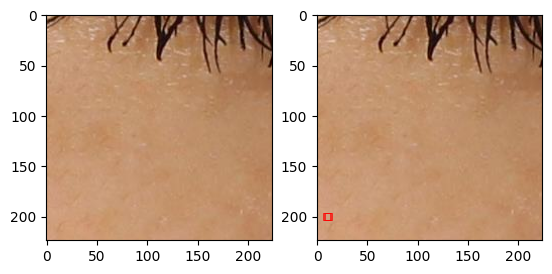

0
Class 0
number of boxes:  0


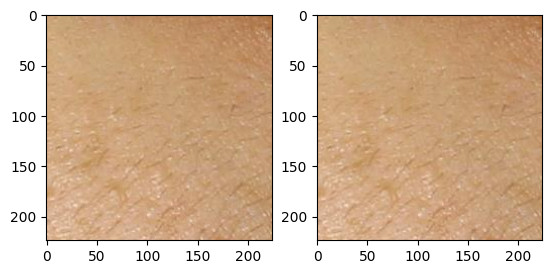

0
Class 0
number of boxes:  0


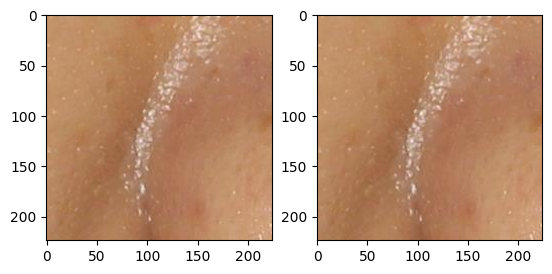

24945
Class 3
number of boxes:  568


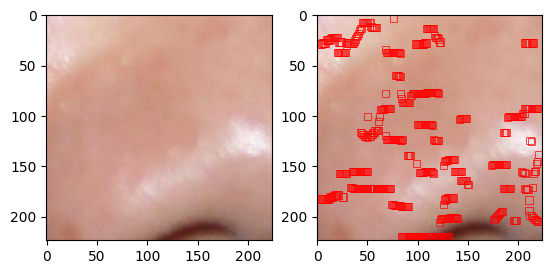

15311
Class 3
number of boxes:  286


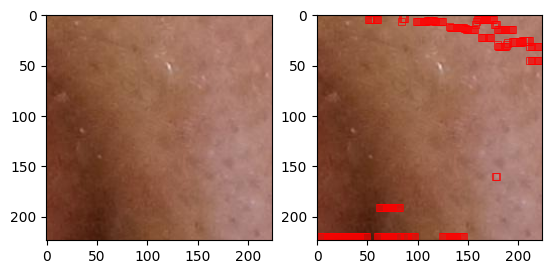

0
Class 0
number of boxes:  0


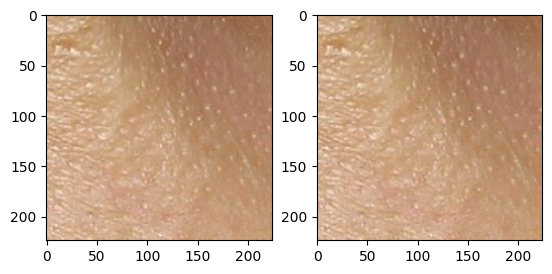

0
Class 0
number of boxes:  0


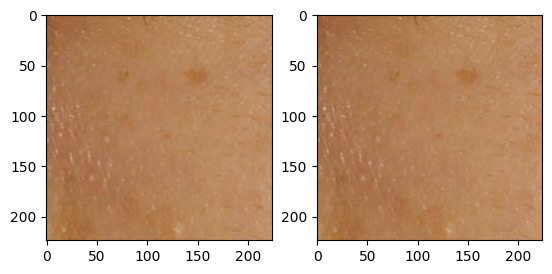

646
Class 0
number of boxes:  59


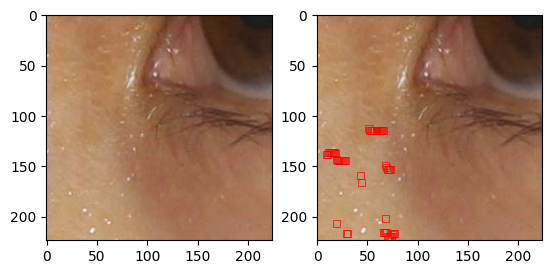

922
Class 0
number of boxes:  126


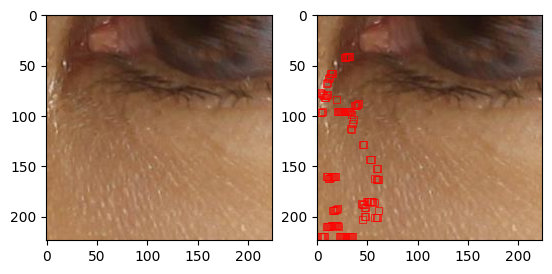

0
Class 0
number of boxes:  0


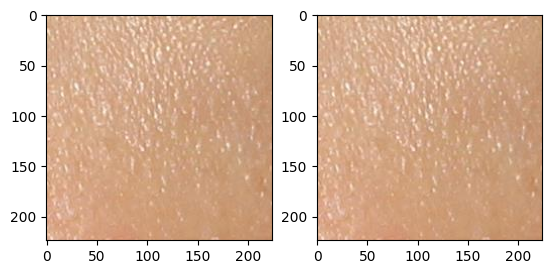

0
Class 0
number of boxes:  0


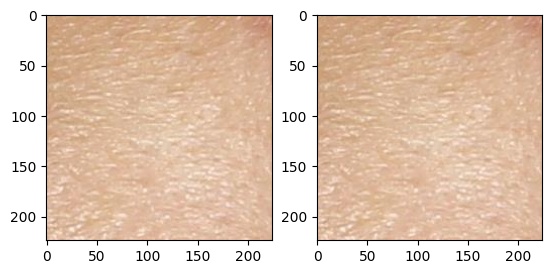

0
Class 0
number of boxes:  0


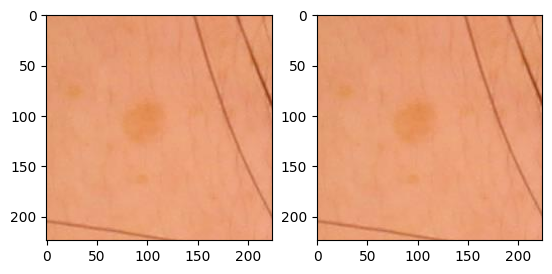

2429
Class 0
number of boxes:  155


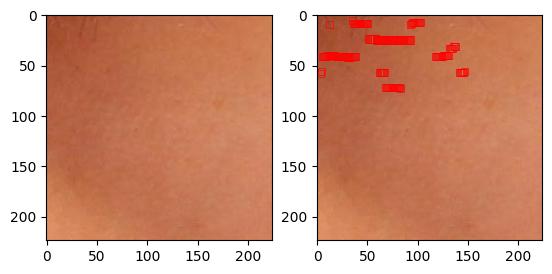

265
Class 0
number of boxes:  30


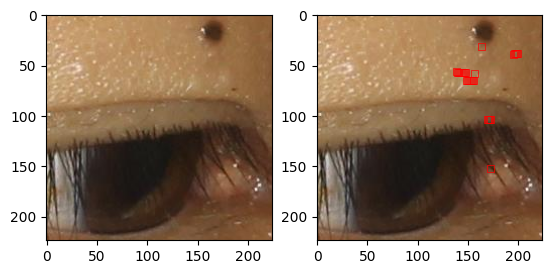

0
Class 0
number of boxes:  0


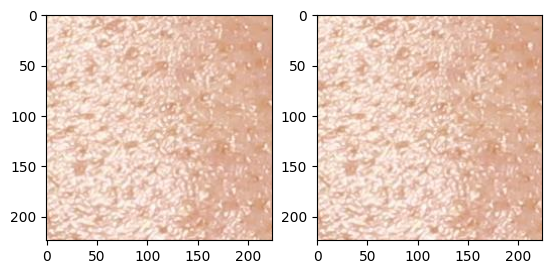

2082
Class 0
number of boxes:  203


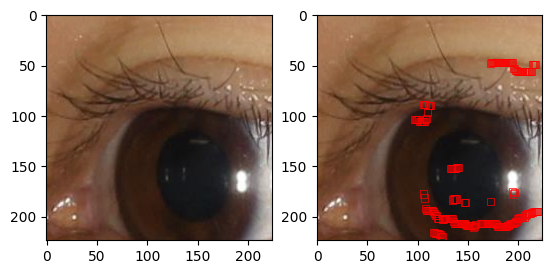

101
Class 0
number of boxes:  31


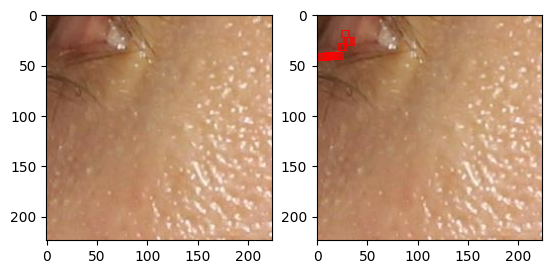

4
Class 0
number of boxes:  2


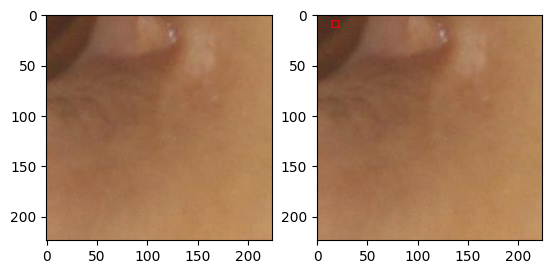

0
Class 0
number of boxes:  0


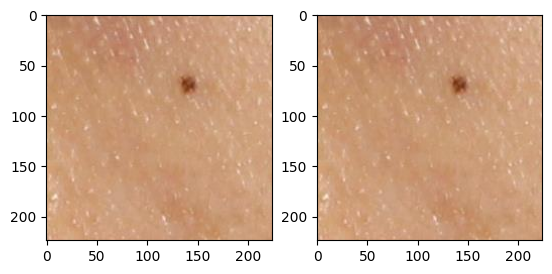

1829
Class 0
number of boxes:  180


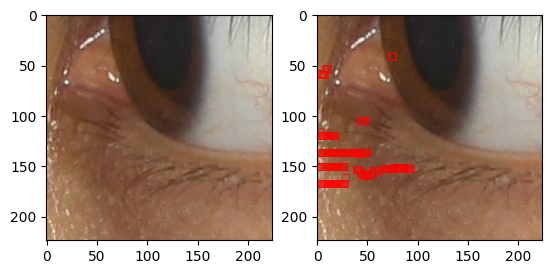

20587
Class 3
number of boxes:  842


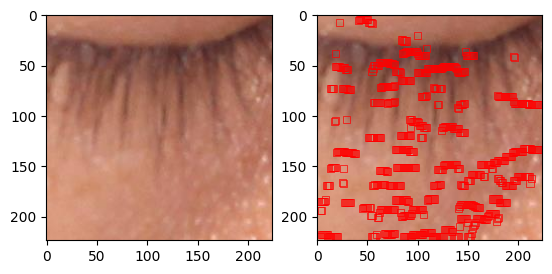

84
Class 0
number of boxes:  30


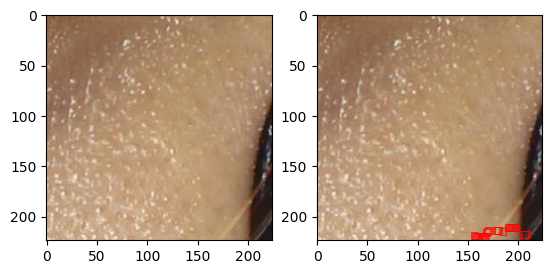

16
Class 0
number of boxes:  4


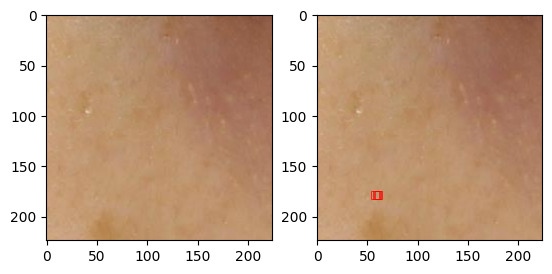

452
Class 0
number of boxes:  85


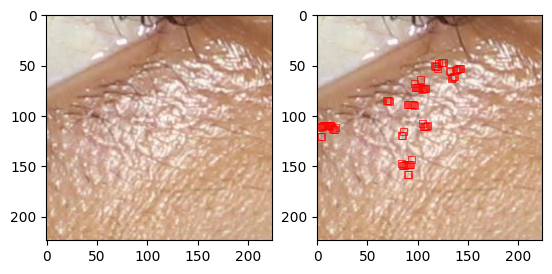

18198
Class 3
number of boxes:  743


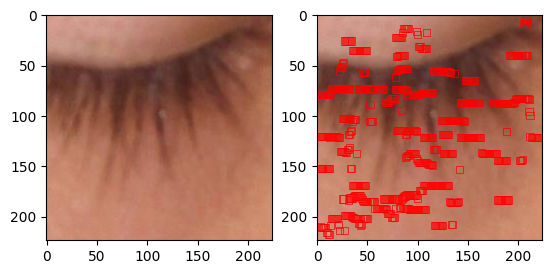

0
Class 0
number of boxes:  0


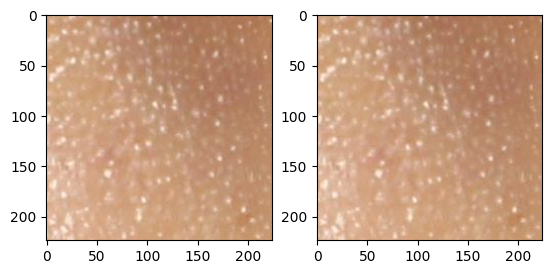

0
Class 0
number of boxes:  0


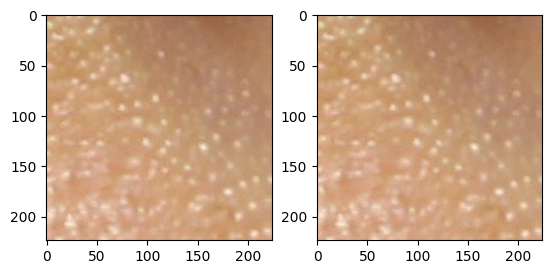

0
Class 0
number of boxes:  0


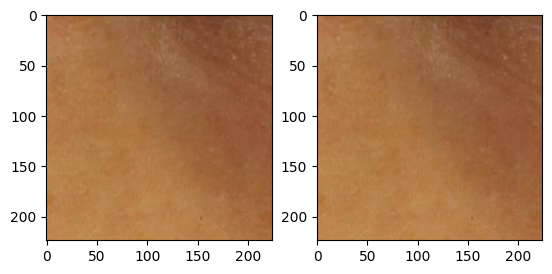

0
Class 0
number of boxes:  0


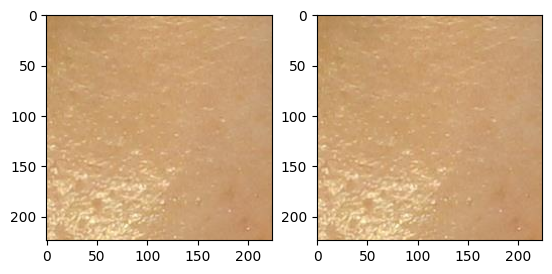

0
Class 0
number of boxes:  0


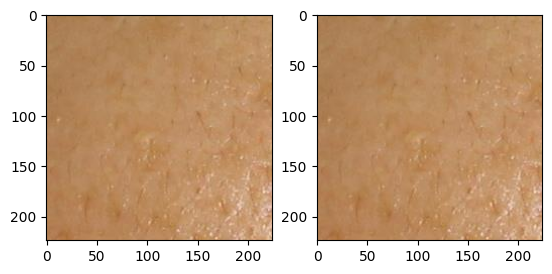

79
Class 0
number of boxes:  15


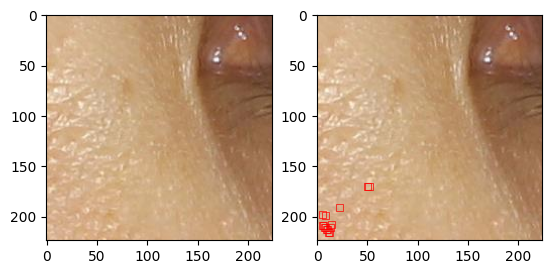

725
Class 0
number of boxes:  59


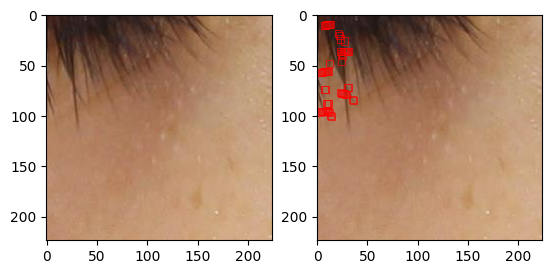

0
Class 0
number of boxes:  0


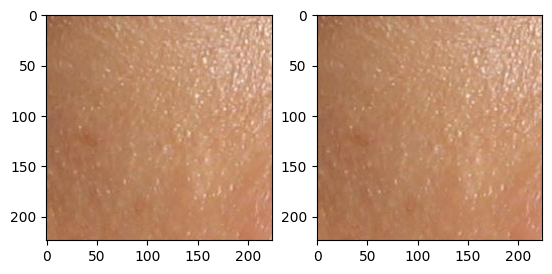

119
Class 0
number of boxes:  44


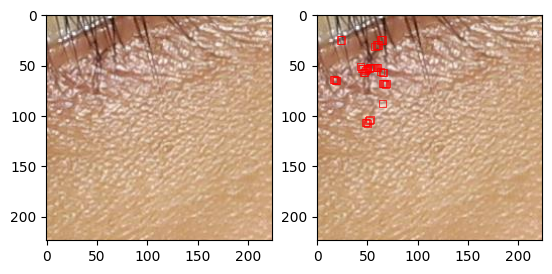

0
Class 0
number of boxes:  0


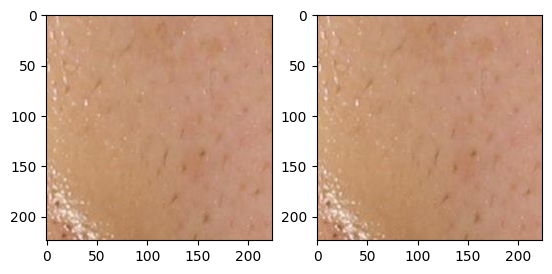

10366
Class 2
number of boxes:  503


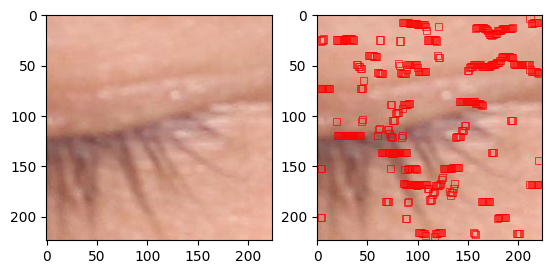

0
Class 0
number of boxes:  0


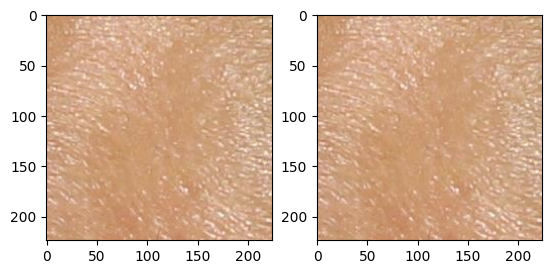

0
Class 0
number of boxes:  0


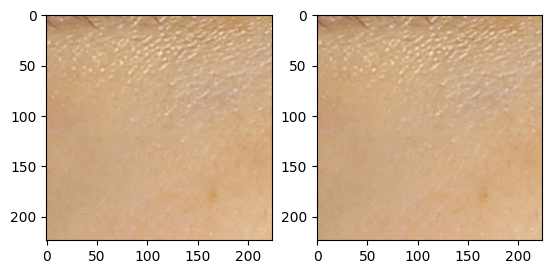

0
Class 0
number of boxes:  0


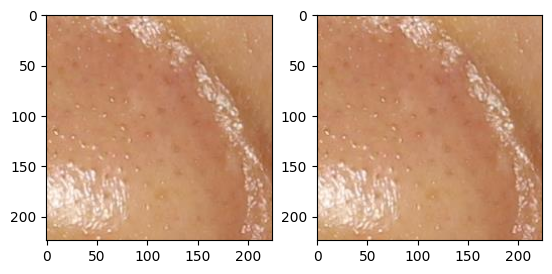

8
Class 0
number of boxes:  4


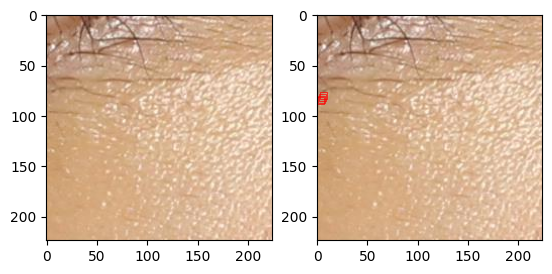

KeyboardInterrupt: 

In [ ]:
clusterRedWithBoxes('/content/drive/MyDrive/acne04.v1i.multiclass/train/level0')

In [ ]:
clusterRed('/content/drive/MyDrive/acne04.v1i.multiclass/test/level0')

In [ ]:
clusterRed('/content/drive/MyDrive/acne04.v1i.multiclass/test/level1')

In [ ]:
clusterRed('/content/drive/MyDrive/acne04.v1i.multiclass/test/level2')

In [ ]:
clusterRed('/content/drive/MyDrive/acne04.v1i.multiclass/test/level3')

In [ ]:
clusterRed('/content/drive/MyDrive/acne04.v1i.multiclass/train/level3')

CNN FOR 4 LEVEL CLASSIFICATION:

In [ ]:
import matplotlib.pyplot as plt
def train(model, train_data, val_data, learning_rate, batch_size=50, num_epochs=10):
    train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)
    val_loader = torch.utils.data.DataLoader(val_data, batch_size=batch_size, shuffle=True)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)

    train_err = np.zeros(num_epochs)
    train_loss = np.zeros(num_epochs)
    val_err = np.zeros(num_epochs)
    val_loss = np.zeros(num_epochs)
    start_time = time.time()
    n = 0
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        correct = 0
        total = 0
        for imgs, labels in iter(train_loader):

            out = model(imgs)

            loss = criterion(out, labels)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            total_loss += loss.item()
            _, predicted = out.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
            n += 1

        train_loss[epoch] = total_loss /len(train_loader)
        train_err[epoch] = 1 - (correct/total)

        model.eval()
        total_loss = 0
        correct = 0
        total = 0

        for imgs, labels in iter(val_loader):

            out = model(imgs)

            loss = criterion(out, labels)
            total_loss += loss.item()
            _, predicted = out.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

        val_loss[epoch] = total_loss /len(train_loader)
        val_err[epoch] = 1 - (correct/total)

        print(("Epoch {}: Train err: {}, Train loss: {} |"+
               "Validation err: {}, Validation loss: {}").format(
                   epoch + 1,
                   train_err[epoch],
                   train_loss[epoch],
                   val_err[epoch],
                   val_loss[epoch]))
        model_path = get_model_name(model.name, batch_size, learning_rate, epoch)
        torch.save(model.state_dict(), model_path)
    print('Finished Training')
    end_time = time.time()
    elapsed_time = end_time - start_time
    print("Total time elapsed: {:.2f} seconds".format(elapsed_time))

    epochs = np.arange(1, num_epochs + 1)
    np.savetxt("{}_train_err.csv".format(model_path), train_err)
    np.savetxt("{}_train_loss.csv".format(model_path), train_loss)
    np.savetxt("{}_val_err.csv".format(model_path), val_err)
    np.savetxt("{}_val_loss.csv".format(model_path), val_loss)

In [ ]:
def get_model_name(name, batch_size, learning_rate, epoch):

    path = "model_{0}_bs{1}_lr{2}_epoch{3}".format(name,
                                                   batch_size,
                                                   learning_rate,
                                                   epoch)
    return path

In [ ]:
this_model = AcneSeverity()
#def train(model, train_data, val_data, learning_rate, batch_size=50, num_epochs=10):
train(this_model, acne_train, acne_validation, 0.05, 256, 10 )
#acne_train = datasets.ImageFolder('/content/drive/MyDrive/acne04.v1i.multiclass/train', transform_app)
#acne_validation = datasets.ImageFolder('/content/drive/MyDrive/acne04.v1i.multiclass/valid', transform_app)
#acne_test = datasets.ImageFolder('/content/drive/MyDrive/acne04.v1i.multiclass/test', transform_app)

Epoch 1: Train err: 0.7207977207977208, Train loss: 1.385617971420288 |Validation err: 0.5384615384615384, Validation loss: 0.43085745970408124
Epoch 2: Train err: 0.6994301994301995, Train loss: 1.3411927223205566 |Validation err: 0.5174825174825175, Validation loss: 0.411874254544576
Epoch 3: Train err: 0.6524216524216524, Train loss: 1.2285892566045125 |Validation err: 0.6363636363636364, Validation loss: 0.41006147861480713
Epoch 4: Train err: 0.5071225071225072, Train loss: 1.1659697691599529 |Validation err: 0.7622377622377623, Validation loss: 0.5950961112976074
Epoch 5: Train err: 0.6481481481481481, Train loss: 1.3962599833806355 |Validation err: 0.5804195804195804, Validation loss: 0.46462535858154297
Epoch 6: Train err: 0.6780626780626781, Train loss: 1.3877113262812297 |Validation err: 0.5384615384615384, Validation loss: 0.4566532373428345
Epoch 7: Train err: 0.6794871794871795, Train loss: 1.3781232039133708 |Validation err: 0.5384615384615384, Validation loss: 0.44695146

In [ ]:
this_model = AcneSeverity()
#def train(model, train_data, val_data, learning_rate, batch_size=50, num_epochs=10):
train(this_model, acne_train, acne_validation, 0.02, 64, 10 )

Epoch 1: Train err: 0.6623931623931624, Train loss: 1.3711377707394687 |Validation err: 0.6293706293706294, Validation loss: 0.342278469692577
Epoch 2: Train err: 0.5299145299145299, Train loss: 1.2171309211037376 |Validation err: 0.6643356643356644, Validation loss: 0.8434288718483665
Epoch 3: Train err: 0.5384615384615384, Train loss: 1.286042245951566 |Validation err: 0.6293706293706294, Validation loss: 0.38548505306243896
Epoch 4: Train err: 0.5, Train loss: 1.186958459290591 |Validation err: 0.6503496503496504, Validation loss: 0.7045490091497247
Epoch 5: Train err: 0.4700854700854701, Train loss: 1.100948772647164 |Validation err: 0.6433566433566433, Validation loss: 0.6373282345858488
Epoch 6: Train err: 0.4330484330484331, Train loss: 1.046924108808691 |Validation err: 0.6713286713286714, Validation loss: 0.581475702199069
Epoch 7: Train err: 0.4088319088319088, Train loss: 0.9353245984424244 |Validation err: 0.6573426573426573, Validation loss: 0.7371216253800825
Epoch 8: Tra

In [ ]:
#model.load_state_dict(torch.load("saved_model"))
final_model = AcneSeverity()
final_model.load_state_dict(torch.load("model_4_classes_bs64_lr0.02_epoch9"))

<All keys matched successfully>

In [ ]:
train(final_model, acne_train, acne_validation, 0.01, 64, 10 )

Epoch 1: Train err: 0.28490028490028485, Train loss: 0.613646385344592 |Validation err: 0.6503496503496504, Validation loss: 1.3903924335132947
Epoch 2: Train err: 0.2678062678062678, Train loss: 0.5944057703018188 |Validation err: 0.6503496503496504, Validation loss: 1.3082436648282139
Epoch 3: Train err: 0.24643874643874641, Train loss: 0.5573719685727899 |Validation err: 0.6643356643356644, Validation loss: 1.5227533253756436
Epoch 4: Train err: 0.22649572649572647, Train loss: 0.5161420892585408 |Validation err: 0.6713286713286714, Validation loss: 1.4937439398332075
Epoch 5: Train err: 0.23646723646723644, Train loss: 0.5181799232959747 |Validation err: 0.6643356643356644, Validation loss: 1.8159570260481401
Epoch 6: Train err: 0.20940170940170943, Train loss: 0.5036136101592671 |Validation err: 0.6573426573426573, Validation loss: 1.1591654040596702
Epoch 7: Train err: 0.2193732193732194, Train loss: 0.5393566651777788 |Validation err: 0.6643356643356644, Validation loss: 1.91846

In [ ]:
def get_accuracy_test(model):

    data = acne_test
    truth_list = []
    prediction_list = []

    correct = 0
    total = 0
    for imgs, labels in torch.utils.data.DataLoader(data, batch_size=32, shuffle=True):

        output = model(imgs)
        truth_list.append(labels.numpy())
        pred = output.max(1, keepdim=True)[1]
        prediction_list.append(pred.numpy())
        correct += pred.eq(labels.view_as(pred)).sum().item()
        total += imgs.shape[0]

    return correct / total, truth_list, prediction_list

In [ ]:
final_accuracy, list_for_t, list_for_p = get_accuracy_test(final_model)

In [ ]:
conf_t = np.concatenate(list_for_t)
conf_p = np.concatenate(list_for_p, axis=0)

In [ ]:
print(len(conf_t))

102


In [ ]:
print(len(conf_p))

102


In [ ]:
print(final_accuracy)

0.27450980392156865


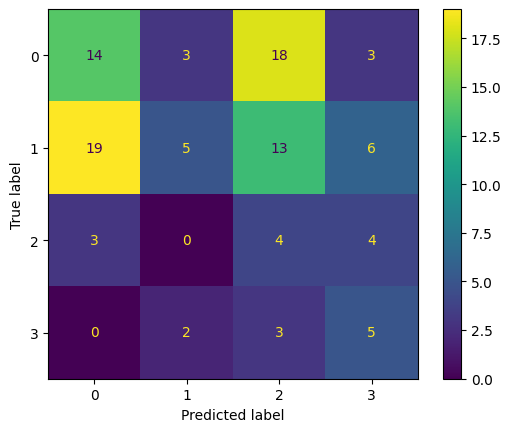

Precision:  0.3942495126705653
Recall:  0.27450980392156865
F1 Score:  0.27312679278748725


In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, precision_recall_fscore_support

cm = confusion_matrix(conf_t, conf_p)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

final_precision, final_recall, final_f1_score, _ = precision_recall_fscore_support(conf_t, conf_p, average='weighted')
print("Precision: ", final_precision)
print("Recall: ", final_recall)
print("F1 Score: ", final_f1_score)

In [ ]:
final_model = AcneSeverity()
final_model.load_state_dict(torch.load("model_4_classes_bs64_lr0.01_epoch9"))

<All keys matched successfully>

In [ ]:
target_size = (224, 224)
transform_app = transforms.Compose([transforms.Resize(target_size), transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]);

testing_one_image = Image.open('/content/drive/MyDrive/acne04.v1i.multiclass/test/level3/levle3_83_jpg.rf.ffb3718446b8538ee1f8d2d8ca1e24a8.jpg')

final_test_for_ = transform_app(testing_one_image)
out = final_model(final_test_for_)
prob_final = F.softmax(out, dim=1)
print(prob_final, torch.sum(prob_final))
print(prob_final.max(1, keepdim=True)[1].item())

In [ ]:
target_size = (224, 224)
transform_app = transforms.Compose([transforms.Resize(target_size), transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]);

testing_one_image = Image.open('/content/drive/MyDrive/acne04.v1i.multiclass/test/level3/levle3_132_jpg.rf.3ee713b60b80de786823b183d1d680a9.jpg')

final_test_for_ = transform_app(testing_one_image)
out = final_model(final_test_for_)
prob_final = F.softmax(out, dim=1)
print(prob_final, torch.sum(prob_final))
print(prob_final.max(1, keepdim=True)[1].item())